# **Analysis of the Oceanographic Data**

This notebook is used to analyse the data obtained from the Drifters and the CDT Casting on the Day 2 of the 2022/2023 Sea Trip. The information obtained is also compared with information from Day 1 and Day 3, likewise, the information from intake 1 (i.e. 2021/2022).
  
__Important Note:__   
Restart the kernel and clear all outputs in the Jupyter Notebook before committing your changes. This avoids unnecessary merge conflicts. 

### Importing Necessary Modules for the Notebook

In [23]:
# Python-based Libraries
import os
from datetime import timedelta, time
from math import sin, cos, sqrt, atan2, radians
import datetime as dt

# Data Analysis Libraries
import numpy as np
import pandas as pd

# Graph plotting libraries
import matplotlib.pyplot as plt
import matplotlib.colors as mplcols
from matplotlib import cm
try:
    import folium
except ModuleNotFoundError: # If folium library is not installed
    !pip3 install folium
    import folium
import branca.colormap as bcm

    
try:
    import ctd
except ModuleNotFoundError: # If folium library is not installed
    !pip3 install ctd
    import ctd
    
# Filtering Data before Plotting
from scipy import signal

### Connecting to Path

In [24]:
# Defining the path of the Group folder on Google Drive
path = os.path.abspath("./")

# Check if the files are accessible
os.listdir(path)

['CTDData',
 'CleanedDriftersData',
 'OtherDaysData',
 'LastYearData',
 'logsheet.xlsx',
 '.ipynb_checkpoints',
 'OceanographyAnalysis.ipynb',
 'Graphs',
 'DriftersData',
 '.git',
 '.idea']

## Import Drifter Data



In [25]:
# Initializing a Dictionary datatype that stores data for each Drifter
data = {}

# Iterate through all file
for file in os.listdir(f"{path}/DriftersData"):

    # Data from the White Drifters are stored in ".csv" formats using "UTF-16 LE" Encoding
    if file.endswith(".csv"):
        
        data_key = file.split(".")[0][-4:] # Obtaining the name of the Drifter
        data_value = pd.read_csv(f'{path}/DriftersData/{file}', encoding="UTF-16 LE") #The encoding is very important.
        data[data_key] = data_value # Storing the data in the "data" dictionary
    
    # Data from the Yellow Drifters are stored in ".txt" formats using "UTF-8" Encoding
    elif file.endswith(".txt"):
        
        data_key = file.split(".")[0][-3:] # Obtaining the name of the Drifter
        data_value = pd.read_csv(f'{path}/DriftersData/{file}', encoding="UTF-8") #The encoding is very important.
        data[data_key] = data_value # Storing the data in the "data" dictionary

# Show the names of all drifters for which the data has been read
print(list(data.keys()))

['2052', '8436', '0119', '277', '6439', '274', '3368', '273', '7230']


### Import the Logsheet

In [26]:
log_df = pd.read_excel(f"{path}/logsheet.xlsx")

# Convert the Deployment Time and the Time of Recovery to datetime objects in Pandas
log_df['Deployment Time'] = pd.to_datetime(log_df['Deployment Time'],format= '%H:%M:%S' ).dt.time
log_df['Time of Recovery'] = pd.to_datetime(log_df['Time of Recovery'],format= '%H:%M:%S' ).dt.time

log_df.head(3)

ImportError: Missing optional dependency 'openpyxl'.  Use pip or conda to install openpyxl.

In [ ]:
# Obtaining the drifter info from the logsheet

data_info = {}

for key in data.keys():
    drifter_type = log_df["Type"][log_df["Name"] == float(key)].values
    deploy_time = log_df["Deployment Time"][log_df["Name"] == float(key)].values
    recov_time = log_df["Time of Recovery"][log_df["Name"] == float(key)].values
    station = log_df["Station No"][log_df["Name"] == float(key)].values
    
    info = {"drifter_type":drifter_type, "deploy_time":deploy_time, "recov_time":recov_time, "station":station}
    data_info[key] = info

In [ ]:
if data_info['277']['drifter_type'] == "Y":
    print(1)

1


## **Data Cleaning**



### Converting the time from UTC to Paris Time

In [ ]:
# Checking the data from the yellow drifters
data['273'].head(3)

,Position time (UTC),Reception time (UTC),Latitude (°),Longitude (°),Speed (m/s),Course (°),Status,Battery (V),Temperature (°C)
0,2022-10-12 07:20:00,2022-10-12 07:20:21,43.10374,5.91212,4.16667,102.2,1,4.108,16.1
1,2022-10-12 07:30:00,2022-10-12 07:30:19,43.08793,5.92784,4.00278,85.9,1,4.107,16.9
2,2022-10-12 07:40:00,2022-10-12 07:40:26,43.08135,5.95918,4.58333,120.2,1,4.105,17.2


In [ ]:
# Converting the UTC time to Paris Time [For Yellow Drifters]

def DataClean_YDrifters(data_df):
    data_df['Position time (UTC)'] = pd.to_datetime(data_df['Position time (UTC)'])
    data_df['Reception time (UTC)'] = pd.to_datetime(data_df['Reception time (UTC)'])

    data_df['Position time'] = data_df['Position time (UTC)'] + timedelta(hours = 2)
    data_df['Reception time'] = data_df['Reception time (UTC)'] + timedelta(hours = 2)

    data_df = data_df.drop(labels=['Position time (UTC)', 'Reception time (UTC)', 'Course (°)', 'Reception time',
                                        'Status', 'Battery (V)'], axis=1)

    data_df = data_df.rename(columns={"Latitude (°)":"Latitude", "Longitude (°)":"Longitude", 
                      "Speed (m/s)":"Speed", "Temperature (°C)":"Temperature"}, inplace=False)
    
    data_df["Position time"] = data_df["Position time"].dt.time
    
    return data_df

In [ ]:
# Checking the data from others
data['0119'].head(3)

,DeviceName,DeviceDateTime,BatteryStatus,CommId,Latitude,Longitude
0,0-4410119,2022-10-12 11:11:48,GOOD,0-4410119,43.08366,5.95759
1,0-4410119,2022-10-12 11:07:25,GOOD,0-4410119,43.08342,5.95843
2,0-4410119,2022-10-12 11:01:48,GOOD,0-4410119,43.08297,5.95946


In [ ]:
data['0119'].dtypes

DeviceName         object
DeviceDateTime     object
BatteryStatus      object
CommId             object
Latitude          float64
Longitude         float64
dtype: object

In [ ]:
# Converting the UTC time to Paris Time [For Other Drifters]

def DataClean_ODrifters(data_df):

    data_df['DeviceDateTime'] = pd.to_datetime(data_df['DeviceDateTime'])
    data_df['DeviceDateTime'] = data_df['DeviceDateTime'] + timedelta(hours = 2)

    data_df["Position time"] = pd.to_datetime(data_df["DeviceDateTime"]).dt.time
    
    data_df = data_df.drop(labels=['DeviceName', 'BatteryStatus', 'CommId', "DeviceDateTime"], axis=1)
    
    # Reversing the time to match Y drifter
    data_df_re = data_df[::-1].reset_index(drop = True) 
    
    return data_df_re

In [ ]:
# Clean all data

for key in data.keys():
    if len(key) == 3:
        data[key] = DataClean_YDrifters(data[key])
    elif len(key) == 4:
        data[key] = DataClean_ODrifters(data[key])

In [ ]:
data['277'].head(3)

,Latitude,Longitude,Speed,Temperature,Position time
0,43.10380,5.91181,3.96111,15.8,09:20:00
1,43.08799,5.92791,3.63611,16.8,09:30:00
2,43.08133,5.95918,4.63611,16.9,09:40:00


In [ ]:
data["0119"].head(3)

,Latitude,Longitude,Position time
0,43.10520,5.88573,09:07:29
1,43.10477,5.88992,09:11:51
2,43.10506,5.90206,09:16:52


### Extracting Data from Deployment Time to Recovery Time

In [ ]:
# Extract Data within the Deployment and Recovery time

def extractData(key, data, log_df):

    deploy_time = log_df["Deployment Time"][log_df["Name"] == float(key)]
    recov_time = log_df["Time of Recovery"][log_df["Name"] == float(key)]

    deploy_bool = np.array([(data[key]["Position time"][i] > deploy_time).to_numpy() for i in range(len(data[key]))]).flatten()
    recov_bool = np.array([(data[key]["Position time"][i] < recov_time).to_numpy() for i in range(len(data[key]))]).flatten()

    cleaning_bool = deploy_bool & recov_bool
    data[key] = data[key][cleaning_bool]
    data[key].reset_index(inplace = True)
    
    return data

In [ ]:
for key in data.keys():
    data = extractData(key, data, log_df)
    
# All data has been cleaned and extracted at this point

In [ ]:
data["0119"].tail(3)

,index,Latitude,Longitude,Position time
36,47,43.08297,5.95946,13:01:48
37,48,43.08342,5.95843,13:07:25
38,49,43.08366,5.95759,13:11:48


In [ ]:
data["277"].head(3)

,index,Latitude,Longitude,Speed,Temperature,Position time
0,6,43.08001,5.99907,0.0,20.4,10:20:00
1,7,43.07988,5.99818,0.0,20.7,10:30:00
2,8,43.07974,5.99750,0.0,20.7,10:40:00


## **Analysis**

### Computing the Trajectory Velocity

To compute the velocity of the drifter from the latitude and longtitude, we used the spherical law of consine.

let's 

$\phi_1$ and $\phi_1$ be the latitude at point 1,2 

$\lambda_1$ and $\lambda_1$ be the longtitude at point 1,2 

$R$ is the radius of the earth

a is the haversine equation ref. https://en.wikipedia.org/wiki/Haversine_formula 

-------------------------------------------------------------------------------------------------------

$a = hav(\theta) = sin(\frac{\phi_2-\phi_1}{2})^2 + cos(\phi_1)cos(\phi_2)sin(\frac{\lambda_2-\lambda_1}{2})$

$c = 2atan2(\sqrt{a}, \sqrt{1-a})$

$velocity = \frac{Rc}{\Delta{T}}$

In [ ]:
# approximate radius of earth in km
R = 6373.0


# create vectorize function to compute velocity
# #input time values in HH:MM:SS, time2 must be greater than time1 obviously
def calVelocity(data):
    # select columns for latitude, longtitude and time
    df_lat = np.array(data["Latitude"])
    df_long = np.array(data["Longitude"])
    df_time = data["Position time"]
    df_time = pd.to_datetime(df_time.astype(str), format='%H:%M:%S')
    
    # compute delta time
    d_time = np.array(df_time[1:]) - df_time[:-1]
    d_time = d_time.apply(lambda dt_i : dt_i.seconds/60.0)
    
    # compute distance from lat,long
    rad_lat = np.radians(df_lat)
    rad_long = np.radians(df_long)
    d_lat = rad_lat[1:] - np.array(rad_lat[:-1])
    d_long = rad_long[1:] - np.array(rad_long[:-1]) 
    
    a = np.sin(d_lat / 2.0)**2 + np.cos(rad_lat[:-1]) * np.cos(rad_lat[1:]) * np.sin(d_long / 2)**2
    c = 2.0 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    
    distance = R * c
    velocity = distance*1000.0/60.0/np.array(d_time, dtype=float)
    return pd.Series(np.append(0.0, velocity))

In [ ]:
for key in data.keys():
    data[key]["Velocity"] = calVelocity(data[key])
    data[key].drop("index", inplace = True, axis = 1) # Dropping unncessary index
    data [key] = data[key].iloc[1:] # Removing the first row (where v = 0)

In [ ]:
data ['8436'].head(3)

,Latitude,Longitude,Position time,Velocity
3,43.07680,5.97094,10:07:08,0.244439
4,43.07672,5.97034,10:11:43,0.180194
5,43.07665,5.96978,10:16:42,0.154380


### Exporting the Cleaned Data (with Velocities)

In [ ]:
for key in data.keys():
    data[key].to_csv(f'{path}/CleanedDriftersData/{key}.csv')

# All the cleaned data has been exported to a folder for any necessary external use

### Visualizing the Trajectories and Velocities on Graph
By: Farooq and Maria

In [ ]:
# rgb tuple to hexadecimal conversion

def rgb2hex(rgb):
    r, g, b = np.int64(256*rgb)
    return "#{:02x}{:02x}{:02x}".format(r,g,b)

In [ ]:
# Determining the minimum and maximum velocities in the entire data

def velocity_extremes(data):
    min_vel = np.inf
    max_vel = -np.inf

    for key in data.keys():
        min_vel_val = np.min(data[key]["Velocity"])
        max_vel_val = np.max(data[key]["Velocity"])

        min_vel = min_vel_val if min_vel_val < min_vel else min_vel
        max_vel = max_vel_val if max_vel_val > max_vel else max_vel

    return min_vel, max_vel

velocity_extremes(data)

(0.025626215489519835, 0.3405533501074622)

Plotting the Trajectories and Velocities for Each Drifter

In [ ]:
# Function to obtain the centre of the graph for good plotting

def graph_centre(data):
    min_lat = 100
    max_lat = 0
    min_lon = 100
    max_lon = 0

    for key in data.keys():
        min_lat_val = np.min(data[key]["Latitude"])
        min_lon_val = np.min(data[key]["Longitude"])
        max_lat_val = np.max(data[key]["Latitude"])
        max_lon_val = np.max(data[key]["Longitude"])

        min_lat = min_lat_val if min_lat_val < min_lat else min_lat
        max_lat = max_lat_val if max_lat_val > max_lat else max_lat
        min_lon = min_lon_val if min_lon_val < min_lon else min_lon
        max_lon = max_lon_val if max_lon_val > max_lon else max_lon

    lat_centre = np.average([min_lat, max_lat])
    lon_centre= np.average([min_lon, max_lon])

    return lat_centre, lon_centre

graph_centre(data)

(43.082495, 5.97591)

In [ ]:
def plot_vel_traj(df_map, df, name, drifter_type, color_mapper):
    
    if drifter_type == "Y":
        drifter_col, drifter_info = ['#ffff00', '1m Depth']
    elif drifter_type == "WD":
        drifter_col, drifter_info = ['#ffffff', '60cm Depth']
    elif drifter_type == "WND":
        drifter_col, drifter_info = ['#0000ff', 'Surface']
    else:
        drifter_col, drifter_info = ['#000000', 'Unknown']
        
    feature_group = folium.FeatureGroup(f"{name}\n{drifter_info}")
    
    folium.Marker([ df["Latitude"].iloc[-1]+0.001, df["Longitude"].iloc[-1]-0.001 ],
              #popup = folium.Popup(f'{key}', parse_html=True),
              icon=folium.DivIcon(html=f"""<div style="font-family: courier new; color: blue">{f"{name}"}</div>""")
              ).add_to(feature_group )

    rgb_values = [c[:3] for c in color_mapper.to_rgba(df["Velocity"])] # keep rgb and drop the "a" column
    colors = [rgb2hex(rgb) for rgb in rgb_values]

    start = False

    for lat, lon in zip(df["Latitude"], df["Longitude"]):
        if start: line = folium.PolyLine([[prev_lat, prev_long], [lat, lon]], color='white', weight=2).add_to(feature_group )
        else: start = True

        prev_lat = lat
        prev_long = lon

    
    for lat, lon, vel, col in zip(df["Latitude"], df["Longitude"], df["Velocity"], colors):
        circlemarker = folium.CircleMarker(location=(lat,lon), radius=6, 
                            fill=True, fill_color=col, fill_opacity=0.9, 
                            stroke=True, color=drifter_col, weight=1.5, opacity=0.9,
                            popup=folium.Popup(f"{round(vel, 4)} m/s"),
                           ).add_to(feature_group )
        
    feature_group.add_to(df_map)

    return df_map

In [ ]:
# Initializing the Map
plot_map = folium.Map(location = graph_centre(data), zoom_start = 14.5, position="absolute", width='100%', height="100%", 
                      left='0%', top='0%', border=None, min_zoom=13, max_zoom=17)

# position:absolute;width:100%;height:100%;left:0;top:0;border:none !important;" allowfullscreen webkitallowfullscreen mozallowfullscreen

# Plotting the location and velocities into the Map
min_vel, max_vel = velocity_extremes(data)

color_gradients = ['orange', 'red']
velcolmap = bcm.LinearColormap(color_gradients, vmin=min_vel, vmax=max_vel, caption = 'Velocity (m/s)') # The velocity scale
velcolmap.add_to(plot_map)

my_cmap = mplcols.LinearSegmentedColormap.from_list("", color_gradients)
# color_mapper = cm.ScalarMappable(cmap=my_cmap)
color_mapper = cm.ScalarMappable(cmap=cm.OrRd)
color_mapper.set_clim(vmin=min_vel, vmax=max_vel)

for key in data.keys():
    drifter_type = data_info[key]['drifter_type']
    plot_map = plot_vel_traj(plot_map, data[key], key, drifter_type, color_mapper)
    


folium.LayerControl().add_to(plot_map)
    
# plot_map.save(f"{path}/Graphs/TrajAndVelocity.html")
plot_map

### Analysis of Drifter Types

The speeds can be compared using box plot.

In [ ]:
list(data.keys())

In [ ]:
key = '277'
drifter_type = log_df["Type"][log_df["Name"] == float(key)]
print(drifter_type)
plt.boxplot(data[key]["velocity"])
plt.ylabel("Velocity")
plt.show()

6    Y
Name: Type, dtype: object


KeyError: 'velocity'

dict_keys(['0119', '2052', '3368', '6439', '7230', '8436', '273', '274', '277'])


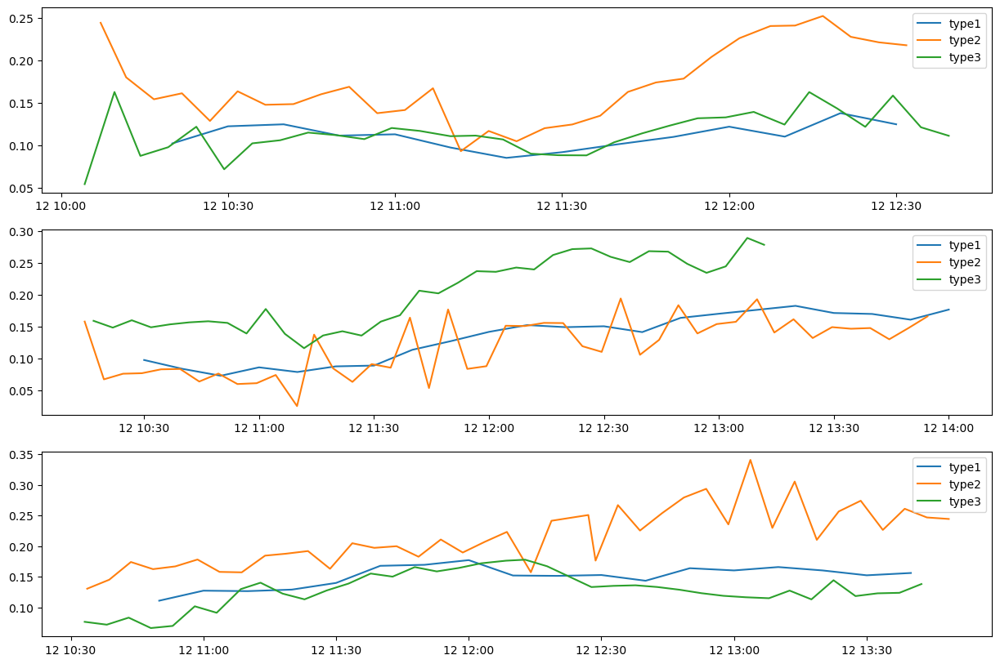

In [ ]:
print(data.keys())
drift_type1 = ["274","273","277"]
drift_type2 = ["8436","7230","2052"]
drift_type3 = ["6439","0119","3368"]
date = dt.date(2022, 10, 12)

fig, ax = plt.subplots(3, 1, figsize=(15,10))
for i in range(3):
    date_time = [dt.datetime.combine(date, t) for t in data[drift_type1[i]]["Position time"]]
    ax[i].plot(date_time, data[drift_type1[i]]["Velocity"])

    date_time = [dt.datetime.combine(date, t) for t in data[drift_type2[i]]["Position time"]]
    ax[i].plot(date_time, data[drift_type2[i]]["Velocity"])

    date_time = [dt.datetime.combine(date, t) for t in data[drift_type3[i]]["Position time"]]
    ax[i].plot(date_time, data[drift_type3[i]]["Velocity"])
    
    ax[i].legend(['type1','type2','type3'])

### Analysis of Circulation

### Analysis of the Daily Variability

#### Collection, Cleaning and Visualization of Day 1 Data

Collecting and Cleaning of Day 1 Data

In [ ]:
# Importing the Logsheet

log1_df = pd.read_excel(f"{path}/OtherDaysData/Day1Logsheet.xlsx")

# Convert the Deployment Time and the Time of Recovery to datetime objects in Pandas
log1_df['Deployment Time'] = pd.to_datetime(log1_df['Deployment Time'],format= '%H:%M:%S' ).dt.time
log1_df['Time of Recovery'] = pd.to_datetime(log1_df['Time of Recovery'],format= '%H:%M:%S' ).dt.time

log1_df.head(3)

In [ ]:
# Defining a function to clean and export all drifter data files in given drifter folder
def clean_drifters(drifter_folder:str, logsheet_df):
    # Initializing a Dictionary datatype that stores data for each Drifter
    data = {}

    # Iterate through all file
    for file in os.listdir(drifter_folder):

        # Obtaining the name of the Drifters and using it as the dictionary key
        
        if file.endswith(".csv"): # Data from the White Drifters are stored in ".csv" formats
            data_key = file.split(".")[0][-4:] # Obtaining the name of the Drifter
            
        elif file.endswith(".txt"): # Data from the Yellow Drifters are stored in ".txt" formats
            data_key = file.split(".")[0][-3:] # Obtaining the name of the Drifter
        else:
            print(f"Unrecognized Filetype: {file}")
            
        encodings = ["UTF-8", "UTF-16 LE"]
        encoding_gotten = False
        for encoding_value in encodings:
            try:
                data_value = pd.read_csv(f'{drifter_folder}/{file}', encoding=encoding_value) #The encoding is very important.
                if "Unnamed: 1" in data_value.columns: # This is used to catch special errors whereby the encoding is wrong but the data is read.
                    continue
                encoding_gotten = True
                break # Stop trying if the options had worked
            except:
                pass # Continue trying if the option didn't work
        
        if encoding_gotten == True:
            data[data_key] = data_value # Storing the data in the "data" dictionary
        else:
            print(f"Encoding error. The encoding for {data_key} data should be checked.")
        
    try:
        data.pop("0549")  # Exclude the drifter from further analysis because the data format is weird
    except KeyError: # Since the problem is only in Day 1 Data, it will excepted in Day 3.
        pass
    
    # Create Directory for Exporting CLeaned Data
    try:
        new_dir_path = f"{drifter_folder}/../CleanedData"
        os.mkdir(new_dir_path, mode = 777)
    except FileExistsError:
        pass
     
    # Clean all data
    for key in data.keys():
        # To remove the unnecessary empty rows in Day 1 Data:
        data[key].dropna(inplace=True)
        
        # Reformat the Data
        if len(key) == 3:
            data[key] = DataClean_YDrifters(data[key])
        elif len(key) == 4:
            data[key] = DataClean_ODrifters(data[key])
        
        # Extracting the Data from the Deployment TIme to the Recovery Time
        data = extractData(key, data, logsheet_df)
        
        # Computing Trajectory Velocities
        data[key]["velocity"] = calVelocity(data[key])
        data[key].drop("index", inplace = True, axis = 1) # Dropping unncessary index
        data [key] = data[key].iloc[1:] # Removing the first row (where v = 0)
        
        # Export Data
        data[key].to_csv(f'{drifter_folder}/../CleanedData/{key}.csv')

    return data

In [ ]:
day1drifters = f"{path}/OtherDaysData/Day1Data/drifters"
data1 = clean_drifters(day1drifters, log1_df)

data1.keys()

Visualization for Day 1

In [ ]:
def visualize_drifters(data):
    
    # Initializing the Map
    data_map = folium.Map(location = graph_centre(data), zoom_start = 14.5, position="absolute", width='100%', height="100%", 
                      left='0%', top='0%', border=None, min_zoom=13, max_zoom=15)
    
    for key in data.keys():
        data_map = plot_vel_traj(data_map, data[key], key)
        
    return data_map

In [ ]:
data1_copied = data1.copy() # To prevent the effect of the next command on the extracted data
data1_copied.pop("2052") # Removal of Drifter "2052" from the map due to "out-of-scope" values.

map_day1 = visualize_drifters(data1_copied)
map_day1.save(f"{path}/Graphs/TrajAndVelocity-Day1.html")
map_day1

#### Collection, Cleaning and Visualization of Day 3 Data

Collecting and Cleaning of Day 3 Data

In [ ]:
# Importing the Logsheet

log3_df = pd.read_excel(f"{path}/OtherDaysData/Day3Logsheet.xlsx")

# Convert the Deployment Time and the Time of Recovery to datetime objects in Pandas
log3_df['Deployment Time'] = pd.to_datetime(log3_df['Deployment Time'],format= '%H:%M:%S' ).dt.time
log3_df['Time of Recovery'] = pd.to_datetime(log3_df['Time of Recovery'],format= '%H:%M:%S' ).dt.time

log3_df.head(3)

In [ ]:
day3drifters = f"{path}/OtherDaysData/Day3Data/drifters"
data3 = clean_drifters(day3drifters, log3_df)

data3.keys()

In [ ]:
data3["279"].head(3)

Visualization for Day 3

In [ ]:
data3_copied = data3.copy() # To prevent the effect of the next command on the extracted data
data3_copied.pop("9666") # Removal of Drifter "2052" from the map because it spans 2 days.
data3_copied.pop("274") # CHECK THE PROBLEM.

map_day3 = visualize_drifters(data3_copied)
map_day3.save(f"{path}/Graphs/TrajAndVelocity-Day3.html")
map_day3

#### Comparison Across the three Days.

## **CTD Data Analysis**

### Import and Clean the CTD Data

Importing the CTD data

In [55]:
ctd_data = {}
ctd_folder = f"{path}/CTDData"

data_columns = ["Pressure", "Temperature", "Salinity", "Oxygen"]

for ctd_file in os.listdir(ctd_folder):
    if ctd_file.endswith(".cnv"):
        data_key = ctd_file.split("_")[0][-1]
        fetched_data = ctd.from_cnv(f'{ctd_folder}/{ctd_file}')
        down_data, up_data = fetched_data.split()
        data_value = {"all":fetched_data, "down":down_data, "up":up_data}

        for df_value_key in data_value:
            data_value[df_value_key].reset_index(inplace=True) # Removing "Pressure" as the index [now a column].
            data_value[df_value_key] = data_value[df_value_key].rename({"Pressure [dbar]":"Pressure", 
                                                                        "t090C":"Temperature", "sal00":"Salinity", 
                                                                        "sbeox0V":"Oxygen"}, axis = "columns")
            data_value[df_value_key] = data_value[df_value_key][ data_value[df_value_key]["flag"]==False ]
            
            if df_value_key in ["up", "all"]:
                # Removing data where the pressure is negative: negative pressure indicates 
                # that the reading is taken outside the sea
                data_value[df_value_key] = data_value[df_value_key][ data_value[df_value_key]["Pressure"]>=0 ]
            
            # Taking only the needed columns
            data_value[df_value_key] = data_value[df_value_key][data_columns]

        ctd_data[data_key] = data_value

In [56]:
ctd_data['4']['up'].head(3)

,Pressure,Temperature,Salinity,Oxygen
341,0.029,21.1328,38.2411,2.4762
342,0.044,21.1332,38.2406,2.4762
343,0.094,21.1328,38.2413,2.4750


Plotting Pressure against Temperature, Salinity and Oxygen _to see the thermocline, halocline and oxycline_.

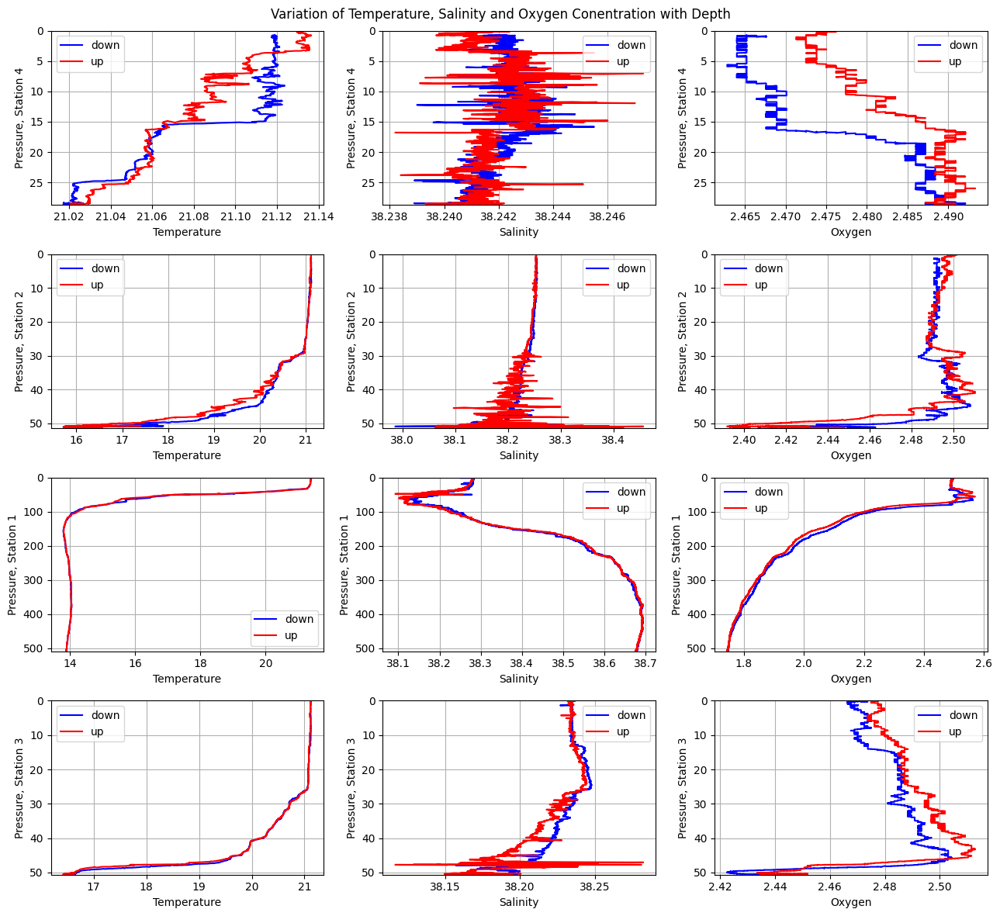

In [57]:
fig, ax = plt.subplots(len(ctd_data), 3, figsize=(13,3*len(ctd_data)))
fig.suptitle('Variation of Temperature, Salinity and Oxygen Conentration with Depth')

for ctd_id, ctd_key in enumerate(ctd_data):
    
    ctd_df = ctd_data[ctd_key]
    
    for id_col, col in enumerate(data_columns[1:]):
        ax[ctd_id, id_col].plot(ctd_df["down"][col], ctd_df["down"]["Pressure"], '-b',
                        ctd_df["up"][col], ctd_df["up"]["Pressure"], '-r')

        ax[ctd_id, id_col].set(ylim=[max(ctd_df["all"]['Pressure']), 0])
        ax[ctd_id, id_col].set(xlabel=col, ylabel=f'Pressure, Station {ctd_key}')
        ax[ctd_id, id_col].grid()
        ax[ctd_id, id_col].locator_params(nbins=7, axis="x")
        ax[ctd_id, id_col].legend(["down", "up"])
        
fig.tight_layout()
plt.show()

Plotting of Pressure against Temperature, Salinity and Oxygen (over the same range of axis)

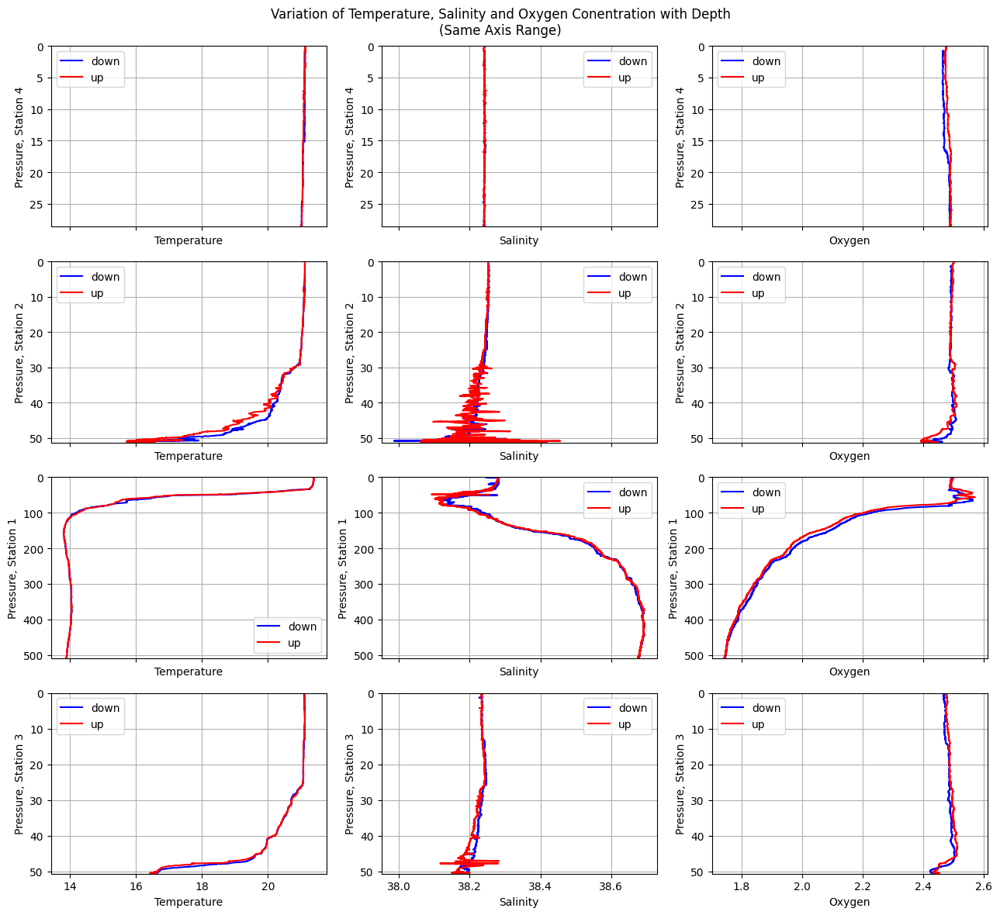

In [58]:
fig, ax = plt.subplots(len(ctd_data), 3, figsize=(13,3*len(ctd_data)), sharex='col')
fig.suptitle('Variation of Temperature, Salinity and Oxygen Conentration with Depth\n(Same Axis Range)')
# plt.locator_params(axis='x', nbins=6)

for ctd_id, ctd_key in enumerate(ctd_data):
    
    ctd_df = ctd_data[ctd_key]
    
    for id_col, col in enumerate(data_columns[1:]):
        ax[ctd_id, id_col].plot(ctd_df["down"][col], ctd_df["down"]["Pressure"], '-b',
                        ctd_df["up"][col], ctd_df["up"]["Pressure"], '-r')

        ax[ctd_id, id_col].set(ylim=[max(ctd_df["all"]['Pressure']), 0])
        ax[ctd_id, id_col].set(xlabel=col, ylabel=f'Pressure, Station {ctd_key}')
        ax[ctd_id, id_col].grid()
        ax[ctd_id, id_col].locator_params(nbins=7, axis="x")
        ax[ctd_id, id_col].legend(["down", "up"])

fig.tight_layout()
plt.show()

Plotting of Filtered Data for Pressure against Temperature, Salinity and Oxygen

In [59]:
len(ctd_df["down"]["Pressure"])

2176

In [60]:
def filter_fxn(data):
    window = 150
    poly = 7
    filtered_data = signal.savgol_filter(data, window, poly)
    
#     sample_rate=24.0
#     time_constant=0.15
    
#     Wn = (1.0 / time_constant) / (sample_rate * 2.0)
#     b, a = signal.butter(2, Wn, "low")
    
#     # b, a = signal.ellip(4, 0.01, 120, 0.125)
#     # b, a = signal.butter(8, 0.125)
    
#     filtered_data = signal.filtfilt(b, a, data)
#                                     # , method="gust")
#     # filtered_data = signal.filtfilt(b, a, data, padlen=50)
    
    return filtered_data

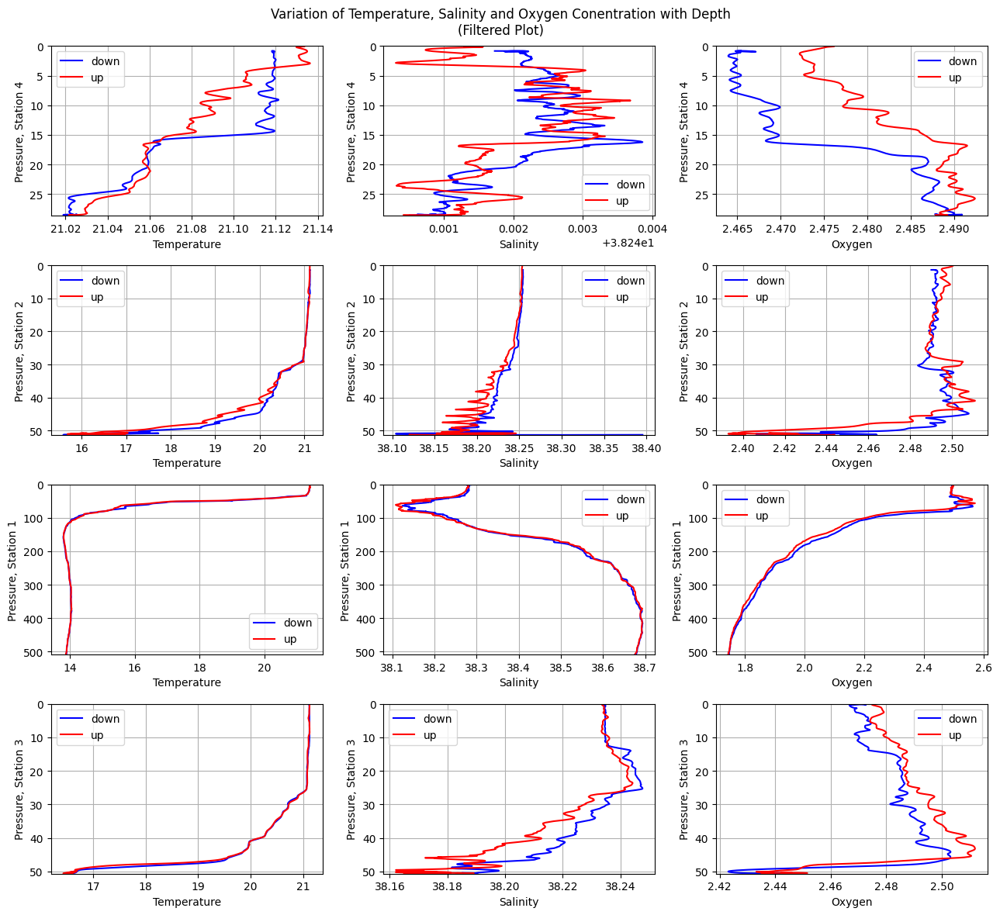

In [61]:
fig, ax = plt.subplots(len(ctd_data), 3, figsize=(13, 3*len(ctd_data)))
fig.suptitle('Variation of Temperature, Salinity and Oxygen Conentration with Depth\n(Filtered Plot)')

for ctd_id, ctd_key in enumerate(ctd_data):
    
    ctd_df = ctd_data[ctd_key]
    
    for id_col, col in enumerate(data_columns[1:]):
        ax[ctd_id, id_col].plot(filter_fxn(ctd_df["down"][col]), filter_fxn(ctd_df["down"]["Pressure"]), '-b',
                        filter_fxn(ctd_df["up"][col]), filter_fxn(ctd_df["up"]["Pressure"]), '-r')
        
        ax[ctd_id, id_col].set(ylim=[max(ctd_df["all"]['Pressure']), 0])
        ax[ctd_id, id_col].set(xlabel=col, ylabel=f'Pressure, Station {ctd_key}')
        ax[ctd_id, id_col].grid()
        ax[ctd_id, id_col].locator_params(nbins=7, axis="x")
        ax[ctd_id, id_col].legend(["down", "up"])
        
fig.tight_layout()
plt.show()

### Plot the T-S Profile

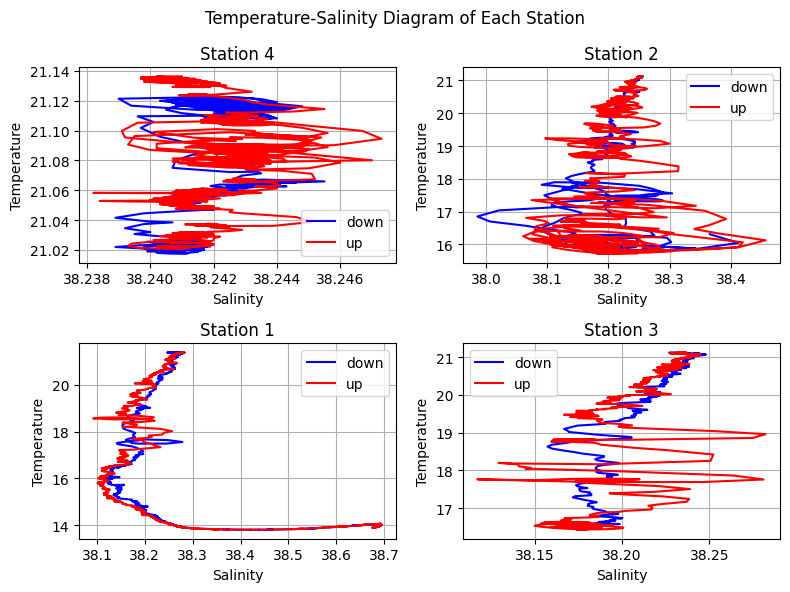

In [62]:
fig, ax = plt.subplots(2, 2, figsize=( 8, 3*len(ctd_data)/2 ))
fig.suptitle('Temperature-Salinity Diagram of Each Station')

for ctd_id, ctd_key in enumerate(ctd_data):
    
    # Brief Manipulation to obtain the position on the subplot
    if ctd_id < 2: 
        x_ind = 0
        y_ind = ctd_id % 2
    else:
        x_ind = 1
        y_ind = ctd_id % 2
    
    ctd_df = ctd_data[ctd_key]
    
    ax[x_ind, y_ind].plot(ctd_df["down"]["Salinity"], ctd_df["down"]["Temperature"], '-b',
                    ctd_df["up"]["Salinity"], ctd_df["up"]["Temperature"], '-r')
    
    ax[x_ind, y_ind].set(xlabel="Salinity", ylabel='Temperature', title=f"Station {ctd_key}")
    ax[x_ind, y_ind].grid()
    ax[x_ind, y_ind].locator_params(nbins=7, axis="x")
    ax[x_ind, y_ind].legend(["down", "up"])


fig.tight_layout()
plt.show()

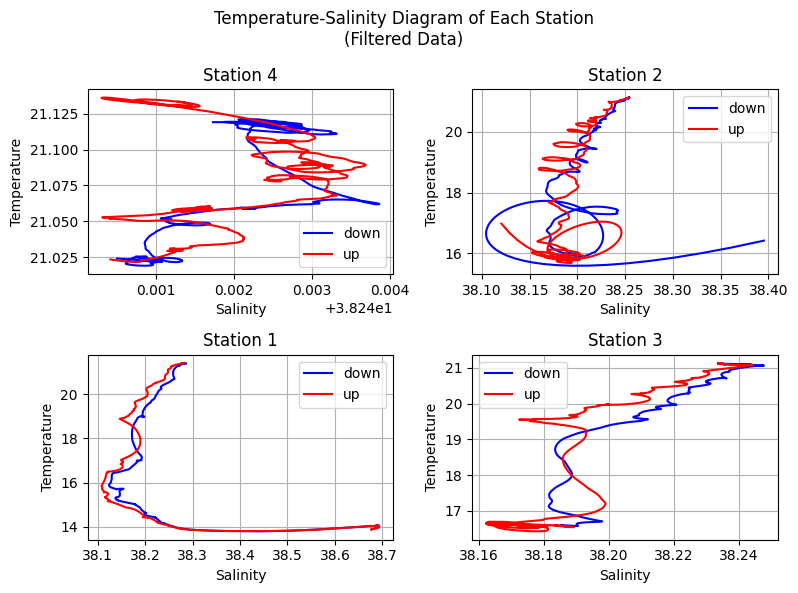

In [63]:
fig, ax = plt.subplots(2, 2, figsize=( 8, 3*len(ctd_data)/2 ))
fig.suptitle('Temperature-Salinity Diagram of Each Station\n(Filtered Data)')

for ctd_id, ctd_key in enumerate(ctd_data):
    
    # Brief Manipulation to obtain the position on the subplot
    if ctd_id < 2: 
        x_ind = 0
        y_ind = ctd_id % 2
    else:
        x_ind = 1
        y_ind = ctd_id % 2
    
    ctd_df = ctd_data[ctd_key]
    
    ax[x_ind, y_ind].plot(filter_fxn(ctd_df["down"]["Salinity"]), filter_fxn(ctd_df["down"]["Temperature"]), '-b',
                    filter_fxn(ctd_df["up"]["Salinity"]), filter_fxn(ctd_df["up"]["Temperature"]), '-r')
    
    ax[x_ind, y_ind].set(xlabel="Salinity", ylabel='Temperature', title=f"Station {ctd_key}")
    ax[x_ind, y_ind].grid()
    ax[x_ind, y_ind].locator_params(nbins=7, axis="x")
    ax[x_ind, y_ind].legend(["down", "up"])


fig.tight_layout()
plt.show()

### Compare the Outputs with Other Days Data

In [97]:
class ctdAnalysis:
    def __init__(self, dataName, folderName, ctdPath):
        self.dataName = dataName
        self.folderName = folderName
        self.ctdPath = ctdPath

    def extractData(self): #Extracting the data from the CTD file
        #%%
        self.dataName = {}
        self.folderName = f"{path}/{self.ctdPath}"

        data_columns = ["Pressure", "Temperature", "Salinity", "Oxygen"]

        for ctd_file in os.listdir(self.folderName):
            if ctd_file.endswith(".cnv"):
                data_key = ctd_file.split("_")[0][-1]
                fetched_data = ctd.from_cnv(f'{self.folderName}/{ctd_file}')
                down_data, up_data = fetched_data.split()
                data_value = {"all":fetched_data, "down":down_data, "up":up_data}

                for df_value_key in data_value:
                    data_value[df_value_key].reset_index(inplace=True) # Removing "Pressure" as the index [now a column].
                    data_value[df_value_key] = data_value[df_value_key].rename({"Pressure [dbar]":"Pressure", 
                                                                                "t090C":"Temperature", "sal00":"Salinity", 
                                                                                "sbeox0V":"Oxygen"}, axis = "columns")
                    data_value[df_value_key] = data_value[df_value_key][ data_value[df_value_key]["flag"]==False ]
                    
                    if df_value_key in ["up", "all"]:
                        # Removing data where the pressure is negative: negative pressure indicates 
                        # that the reading is taken outside the sea
                        data_value[df_value_key] = data_value[df_value_key][ data_value[df_value_key]["Pressure"]>=0 ]
                    
                    # Taking only the needed columns
                    data_value[df_value_key] = data_value[df_value_key][data_columns]

                self.dataName[data_key] = data_value

    #Plotting Pressure against Temperature, Salinity and Oxygen _to see the thermocline, halocline and oxycline_.
    def variationPlot(self, filter): #applies filter if value of filter is true
        if not filter:
            fig, ax = plt.subplots(len(self.dataName), 3, figsize=(13,3*len(self.dataName)))
            fig.suptitle('Variation of Temperature, Salinity and Oxygen Conentration with Depth')

            for ctd_id, ctd_key in enumerate(self.dataName):
                
                ctd_df = self.dataName[ctd_key]
                
                for id_col, col in enumerate(data_columns[1:]):
                    ax[ctd_id, id_col].plot(ctd_df["down"][col], ctd_df["down"]["Pressure"], '-b',
                                    ctd_df["up"][col], ctd_df["up"]["Pressure"], '-r')

                    ax[ctd_id, id_col].set(ylim=[max(ctd_df["all"]['Pressure']), 0])
                    ax[ctd_id, id_col].set(xlabel=col, ylabel=f'Pressure, Station {ctd_key}')
                    ax[ctd_id, id_col].grid()
                    ax[ctd_id, id_col].locator_params(nbins=7, axis="x")
                    ax[ctd_id, id_col].legend(["down", "up"])
                    

            fig.tight_layout()
            plt.show()
        else:
            fig, ax = plt.subplots(len(self.dataName), 3, figsize=(13, 3*len(self.dataName)))
            fig.suptitle('Variation of Temperature, Salinity and Oxygen Conentration with Depth\n(Filtered Plot)')

            for ctd_id, ctd_key in enumerate(self.dataName):
                
                ctd_df = self.dataName[ctd_key]
                
                for id_col, col in enumerate(data_columns[1:]):
                    ax[ctd_id, id_col].plot(filter_fxn(ctd_df["down"][col]), filter_fxn(ctd_df["down"]["Pressure"]), '-b',
                                    filter_fxn(ctd_df["up"][col]), filter_fxn(ctd_df["up"]["Pressure"]), '-r')
                    
                    ax[ctd_id, id_col].set(ylim=[max(ctd_df["all"]['Pressure']), 0])
                    ax[ctd_id, id_col].set(xlabel=col, ylabel=f'Pressure, Station {ctd_key}')
                    ax[ctd_id, id_col].grid()
                    ax[ctd_id, id_col].locator_params(nbins=7, axis="x")
                    ax[ctd_id, id_col].legend(["down", "up"])
                    
            fig.tight_layout()
            plt.show()

    #Plotting of Pressure against Temperature, Salinity and Oxygen (over the same range of axis)
    def variationPlotSameRange(self):
        fig, ax = plt.subplots(len(self.dataName), 3, figsize=(13,3*len(self.dataName)), sharex='col')
        fig.suptitle('Variation of Temperature, Salinity and Oxygen Conentration with Depth\n(Same Axis Range)')
        # plt.locator_params(axis='x', nbins=6)

        for ctd_id, ctd_key in enumerate(self.dataName):
            
            ctd_df = self.dataName[ctd_key]
            
            for id_col, col in enumerate(data_columns[1:]):
                ax[ctd_id, id_col].plot(ctd_df["down"][col], ctd_df["down"]["Pressure"], '-b',
                                ctd_df["up"][col], ctd_df["up"]["Pressure"], '-r')

                ax[ctd_id, id_col].set(ylim=[max(ctd_df["all"]['Pressure']), 0])
                ax[ctd_id, id_col].set(xlabel=col, ylabel=f'Pressure, Station {ctd_key}')
                ax[ctd_id, id_col].grid()
                ax[ctd_id, id_col].locator_params(nbins=7, axis="x")
                ax[ctd_id, id_col].legend(["down", "up"])

        fig.tight_layout()
        plt.show()

    #PLOT THE T-S PROFILE
    def TSPlot(self, filter):
        if not filter:
            fig, ax = plt.subplots(2, 2, figsize=( 10, 5*len(self.dataName)/2 ))
            fig.suptitle('Temperature-Salinity Diagram of Each Station')

            for ctd_id, ctd_key in enumerate(self.dataName):
                
                # Brief Manipulation to obtain the position on the subplot
                if ctd_id < 2: 
                    x_ind = 0
                    y_ind = ctd_id % 2
                else:
                    x_ind = 1
                    y_ind = ctd_id % 2
                
                ctd_df = self.dataName[ctd_key]
                
                ax[x_ind, y_ind].plot(ctd_df["down"]["Salinity"], ctd_df["down"]["Temperature"], '-b',
                                ctd_df["up"]["Salinity"], ctd_df["up"]["Temperature"], '-r')
                
                ax[x_ind, y_ind].set(xlabel="Salinity", ylabel='Temperature', title=f"Station {ctd_key}")
                ax[x_ind, y_ind].grid()
                ax[x_ind, y_ind].locator_params(nbins=7, axis="x")
                ax[x_ind, y_ind].legend(["down", "up"])


            fig.tight_layout()
            plt.show()

        else:
            fig, ax = plt.subplots(2, 2, figsize=( 10, 5*len(self.dataName)/2 ))
            fig.suptitle('Temperature-Salinity Diagram of Each Station\n(Filtered Data)')

            for ctd_id, ctd_key in enumerate(self.dataName):
                
                # Brief Manipulation to obtain the position on the subplot
                if ctd_id < 2: 
                    x_ind = 0
                    y_ind = ctd_id % 2
                else:
                    x_ind = 1
                    y_ind = ctd_id % 2
                
                ctd_df = self.dataName[ctd_key]
                
                ax[x_ind, y_ind].plot(filter_fxn(ctd_df["down"]["Salinity"]), filter_fxn(ctd_df["down"]["Temperature"]), '-b',
                                filter_fxn(ctd_df["up"]["Salinity"]), filter_fxn(ctd_df["up"]["Temperature"]), '-r')
                
                ax[x_ind, y_ind].set(xlabel="Salinity", ylabel='Temperature', title=f"Station {ctd_key}")
                ax[x_ind, y_ind].grid()
                ax[x_ind, y_ind].locator_params(nbins=7, axis="x")
                ax[x_ind, y_ind].legend(["down", "up"])


            fig.tight_layout()
            plt.show()
            
            
        

#################### DAY ONE ################


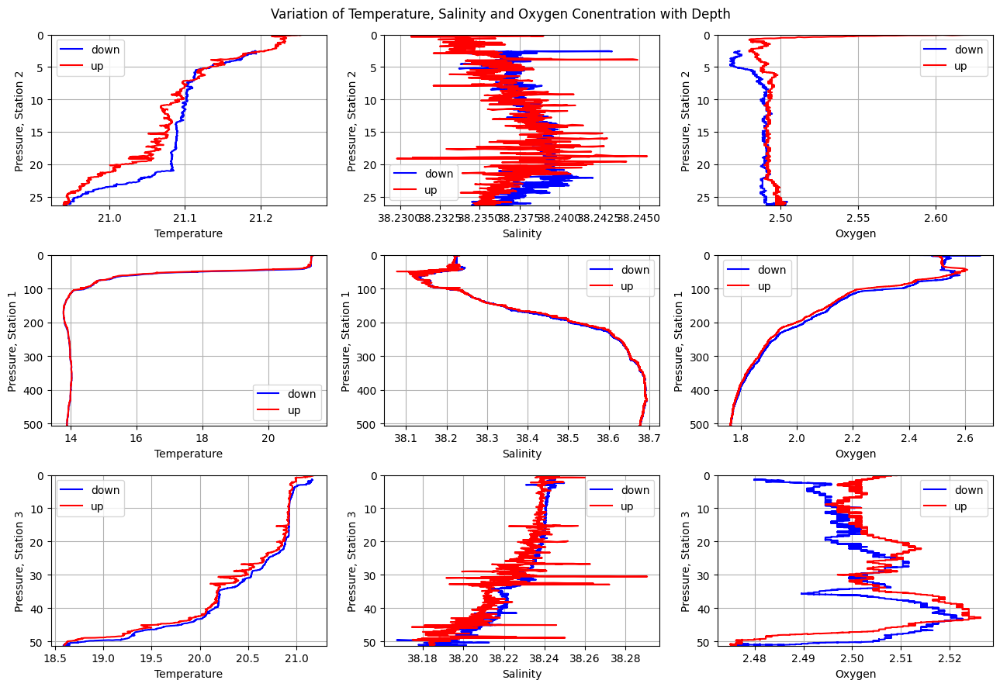

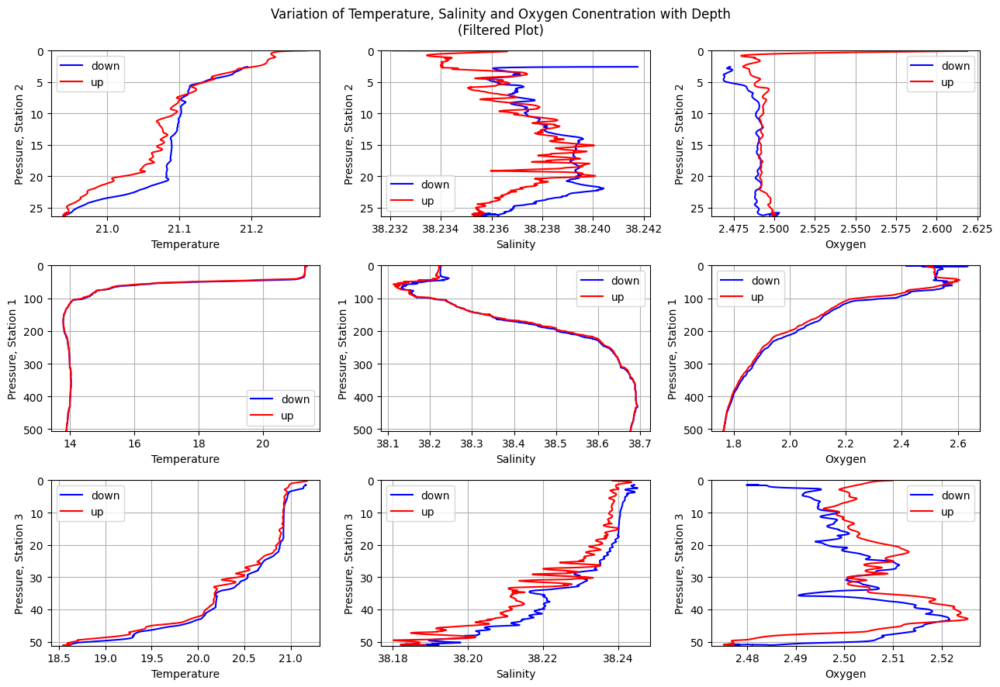

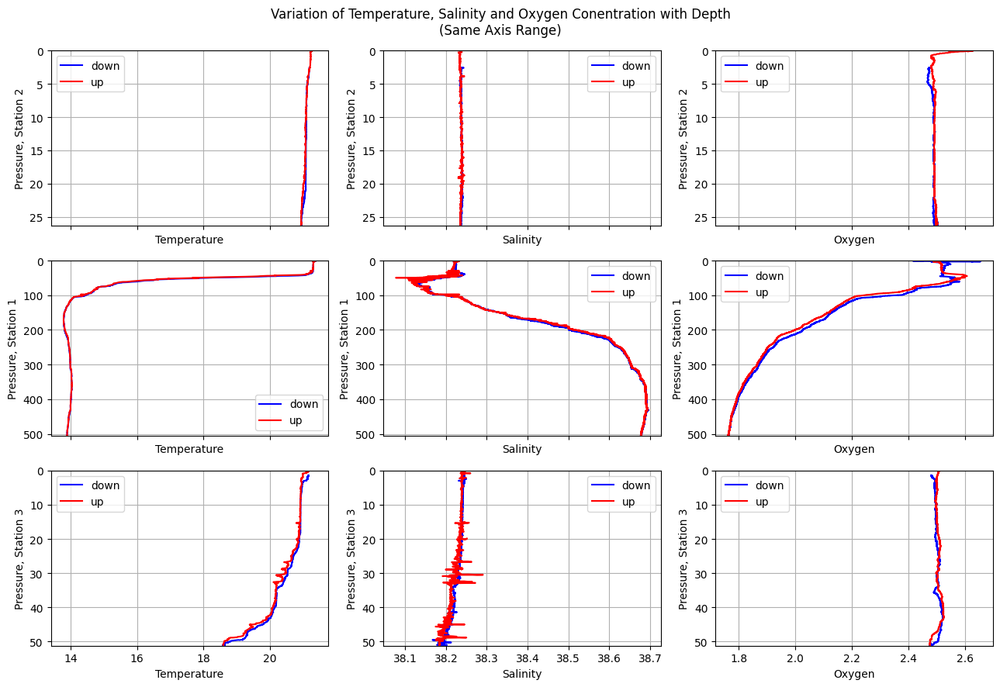

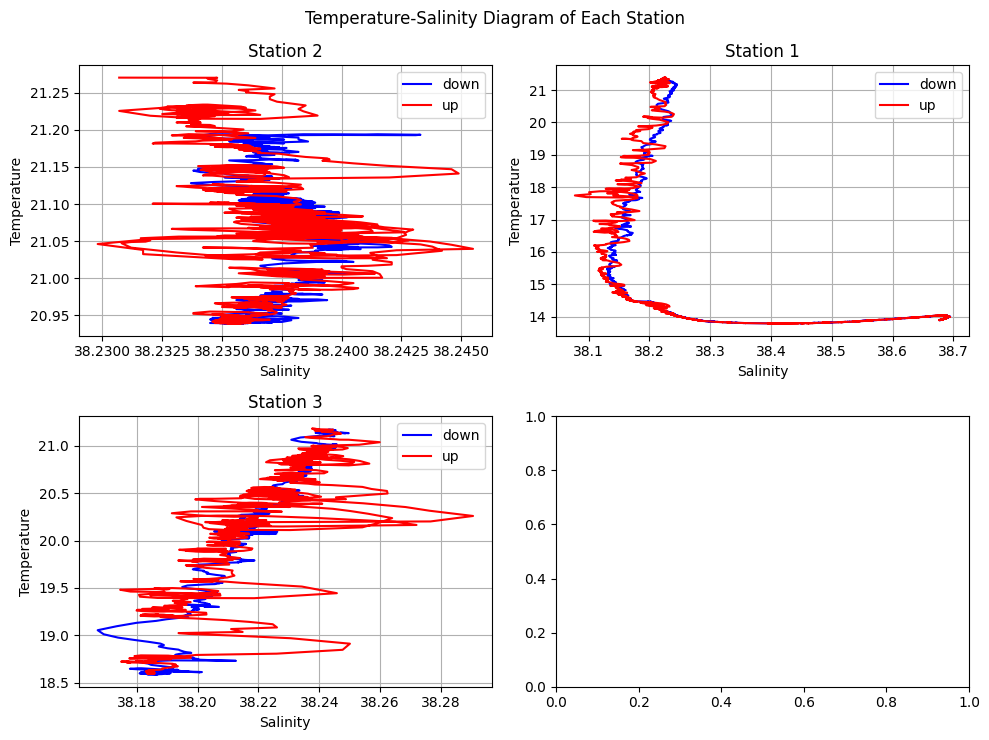

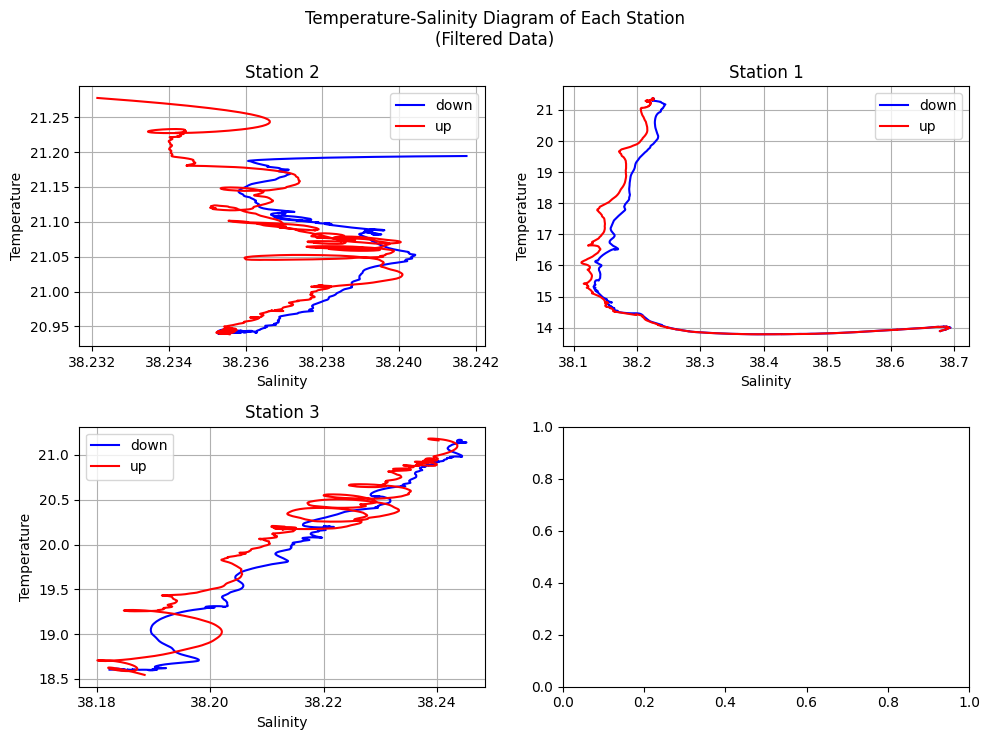

################### DAY THREE #############


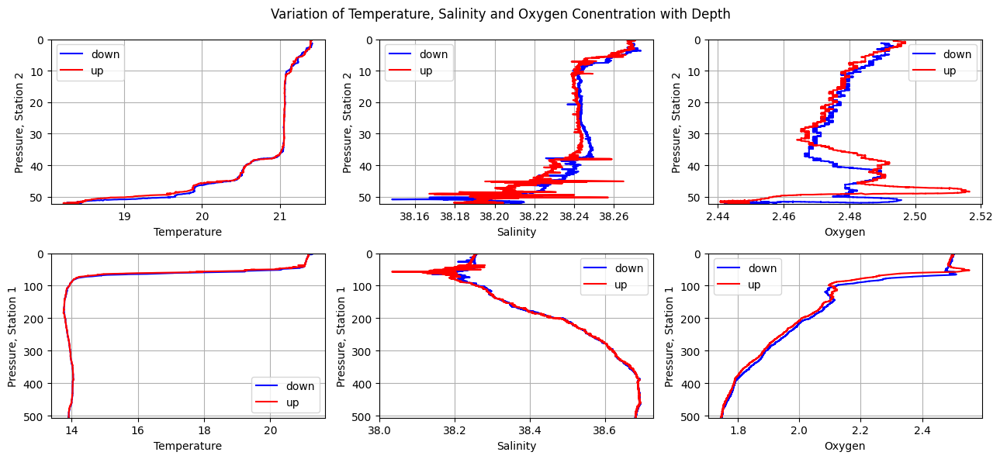

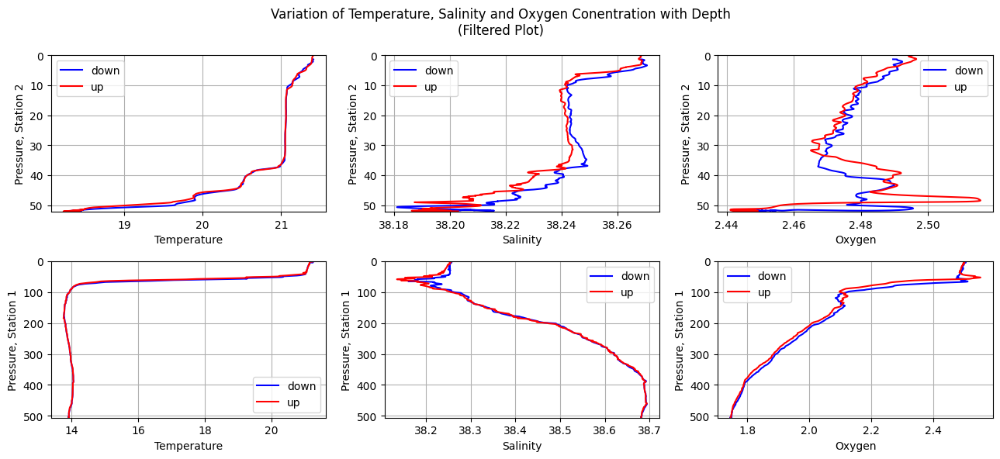

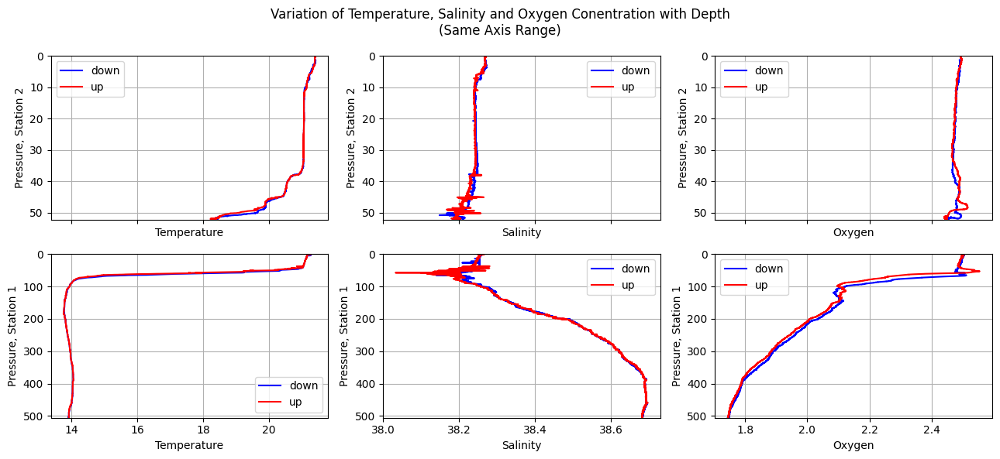

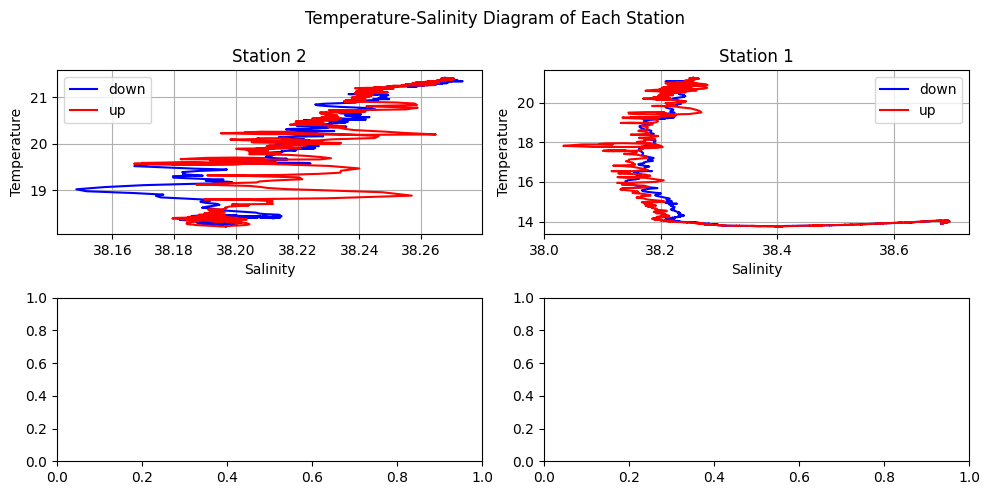

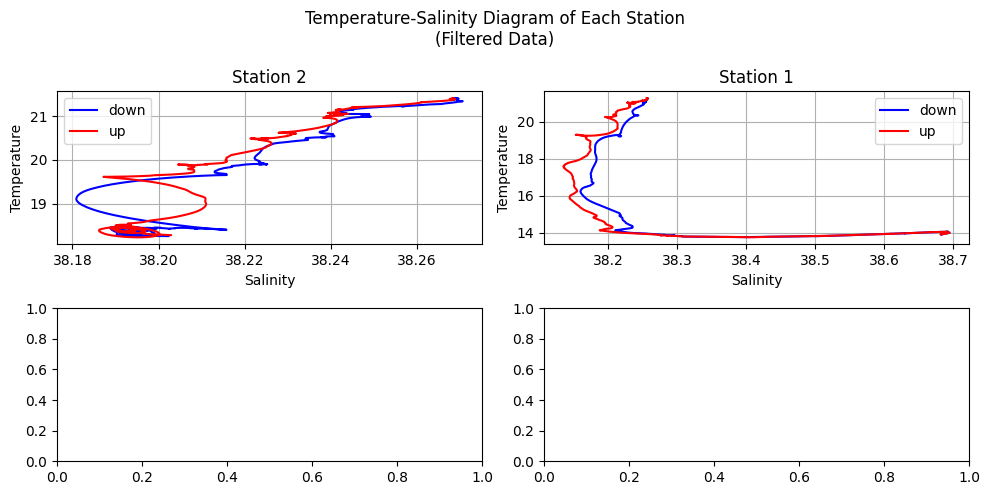

In [99]:
print('#################### DAY ONE ################')
dayOne = ctdAnalysis('ctd_data_1', 'ctd_folder_1', 'OtherDaysData/Day1Data/ctds')
dayOne.extractData()
dayOne.variationPlot(filter=False)
dayOne.variationPlot(filter=True)
dayOne.variationPlotSameRange()
dayOne.TSPlot(filter=False)
dayOne.TSPlot(filter=True)

print('################### DAY THREE #############')
dayThree = ctdAnalysis('ctd_data_3', 'ctd_folder_3', 'OtherDaysData/Day3Data/ctds')
dayThree.extractData()
dayThree.variationPlot(filter=False)
dayThree.variationPlot(filter=True)
dayThree.variationPlotSameRange()
dayThree.TSPlot(filter=False)
dayThree.TSPlot(filter=True)


### Compare the Outputs with 2021 Data